In [116]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)

In [117]:
df=pd.read_csv('avocado.csv')
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015,Albany
1,1,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015,Albany
2,2,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015,Albany
3,3,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015,Albany
4,4,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015,Albany
5,5,22-11-2015,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015,Albany
6,6,15-11-2015,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015,Albany
7,7,08-11-2015,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015,Albany
8,8,01-11-2015,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015,Albany
9,9,25-10-2015,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015,Albany


# Basics of dataset

In [118]:
df.shape

(1517, 14)

In [119]:
df.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

In [120]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [121]:
df.nunique()

Unnamed: 0        52
Date             104
AveragePrice     113
Total Volume    1517
4046            1517
4225            1517
4770            1516
Total Bags      1517
Small Bags      1517
Large Bags      1377
XLarge Bags      711
type               1
year               2
region            51
dtype: int64

# Checking missing values

In [122]:
count=df.isnull().sum()
count

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

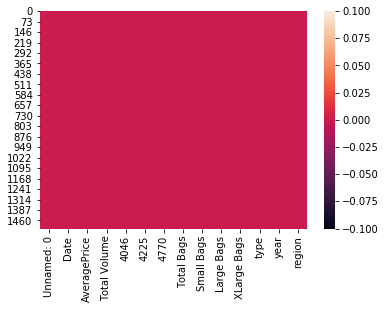

In [123]:
sns.heatmap(df.isnull())

# Converting the date into only'month'

In [124]:
df.Date = pd.to_datetime(df.Date).dt.strftime('%m')


In [125]:
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,12,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015,Albany
1,1,12,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015,Albany
2,2,12,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015,Albany
3,3,06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015,Albany
4,4,11,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015,Albany
5,5,11,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015,Albany
6,6,11,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015,Albany
7,7,08,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015,Albany
8,8,01,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015,Albany
9,9,10,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015,Albany


In [126]:
df2=df

In [127]:
df['others']=df['Total Volume']-(df['4046']+df['4225']+df['4770'])

In [128]:
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,others
0,0,12,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015,Albany,8696.87
1,1,12,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015,Albany,9505.56
2,2,12,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015,Albany,8145.35
3,3,06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015,Albany,5811.16
4,4,11,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015,Albany,6183.95
5,5,11,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015,Albany,6683.91
6,6,11,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015,Albany,8318.86
7,7,08,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015,Albany,6829.22
8,8,01,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015,Albany,11388.36
9,9,10,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015,Albany,8625.92


In [129]:
df.drop(columns=['type','Total Volume','Total Bags'],inplace=True)

In [130]:
df

,Unnamed: 0,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,0,12,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.00,2015,Albany,8696.87
1,1,12,1.35,674.28,44638.81,58.33,9408.07,97.49,0.00,2015,Albany,9505.56
2,2,12,0.93,794.70,109149.67,130.50,8042.21,103.14,0.00,2015,Albany,8145.35
3,3,06,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.00,2015,Albany,5811.16
4,4,11,1.28,941.48,43838.39,75.78,5986.26,197.69,0.00,2015,Albany,6183.95
5,5,11,1.26,1184.27,48067.99,43.61,6556.47,127.44,0.00,2015,Albany,6683.91
6,6,11,0.99,1368.92,73672.72,93.26,8196.81,122.05,0.00,2015,Albany,8318.86
7,7,08,0.98,703.75,101815.36,80.00,6266.85,562.37,0.00,2015,Albany,6829.22
8,8,01,1.02,1022.15,87315.57,85.34,11104.53,283.83,0.00,2015,Albany,11388.36
9,9,10,1.07,842.40,64757.44,113.00,8061.47,564.45,0.00,2015,Albany,8625.92


In [131]:
from sklearn.preprocessing import LabelEncoder

In [132]:
le=LabelEncoder()

In [133]:
for i in ['year','region']:
    df[i]=le.fit_transform(df[i])

In [134]:
df

,Unnamed: 0,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,0,12,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.00,0,0,8696.87
1,1,12,1.35,674.28,44638.81,58.33,9408.07,97.49,0.00,0,0,9505.56
2,2,12,0.93,794.70,109149.67,130.50,8042.21,103.14,0.00,0,0,8145.35
3,3,06,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.00,0,0,5811.16
4,4,11,1.28,941.48,43838.39,75.78,5986.26,197.69,0.00,0,0,6183.95
5,5,11,1.26,1184.27,48067.99,43.61,6556.47,127.44,0.00,0,0,6683.91
6,6,11,0.99,1368.92,73672.72,93.26,8196.81,122.05,0.00,0,0,8318.86
7,7,08,0.98,703.75,101815.36,80.00,6266.85,562.37,0.00,0,0,6829.22
8,8,01,1.02,1022.15,87315.57,85.34,11104.53,283.83,0.00,0,0,11388.36
9,9,10,1.07,842.40,64757.44,113.00,8061.47,564.45,0.00,0,0,8625.92


# Statistics summary

In [135]:
df.describe()

,Unnamed: 0,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
count,1517.000000,1517.000000,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1517.000000,1517.000000,1517.000000,1.517000e+03
mean,26.995386,1.074990,6.464387e+05,6.114375e+05,5.040550e+04,2.487736e+05,4.264205e+04,2181.771074,0.162821,21.196440,2.935974e+05
std,14.848287,0.188891,1.947614e+06,1.672906e+06,1.377812e+05,6.474765e+05,1.182157e+05,7455.712144,0.369324,16.132398,7.579765e+05
min,0.000000,0.490000,4.677200e+02,1.783770e+03,0.000000e+00,3.311770e+03,0.000000e+00,0.000000,0.000000,0.000000,3.311770e+03
25%,14.000000,0.980000,2.040034e+04,4.147606e+04,9.112500e+02,2.972722e+04,5.407400e+02,0.000000,0.000000,6.000000,3.620689e+04
50%,29.000000,1.080000,8.175117e+04,1.186649e+05,7.688170e+03,6.237569e+04,5.044350e+03,0.000000,0.000000,19.000000,7.397906e+04
75%,39.000000,1.190000,3.775785e+05,4.851503e+05,2.916730e+04,1.461994e+05,2.926767e+04,401.480000,0.000000,35.000000,1.576097e+05
max,51.000000,1.680000,1.893304e+07,1.895648e+07,1.381516e+06,5.893642e+06,1.121076e+06,108072.790000,1.000000,50.000000,6.736304e+06


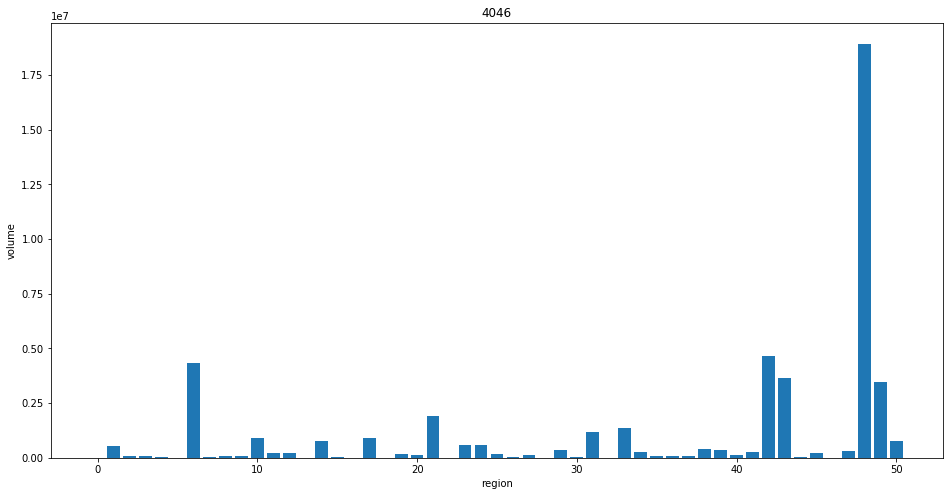

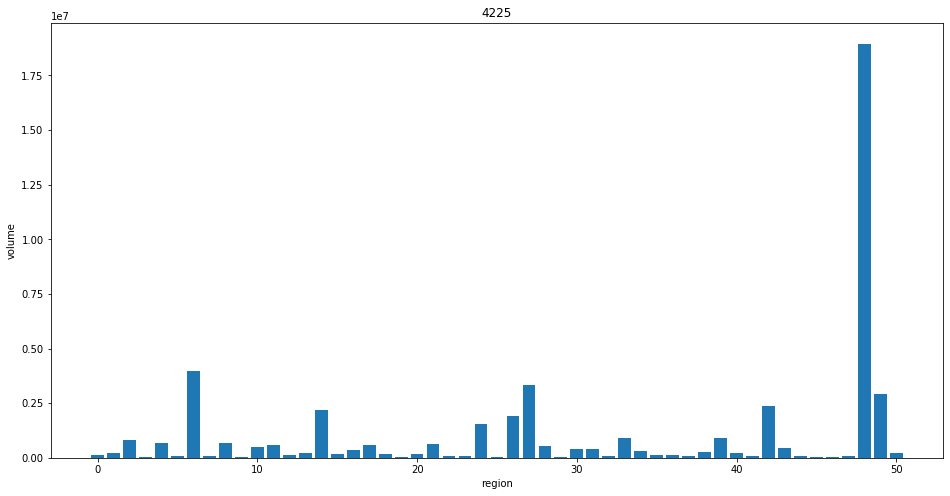

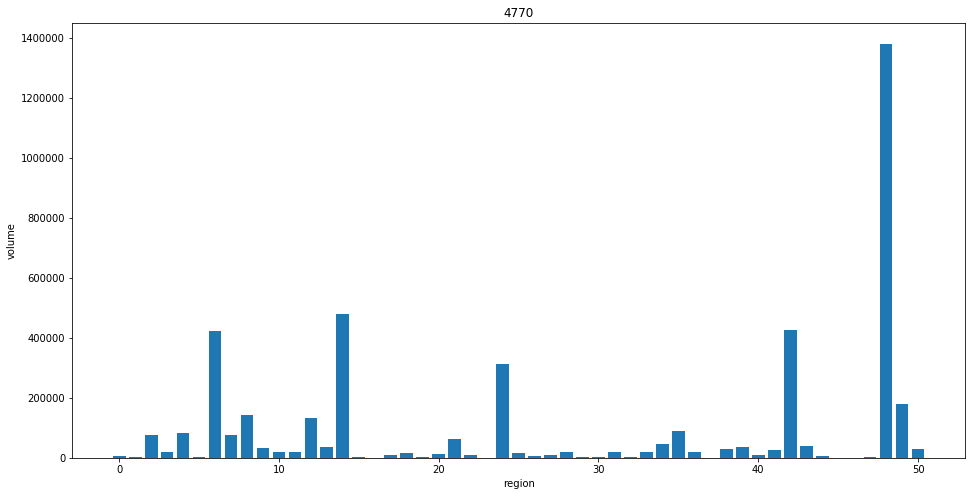

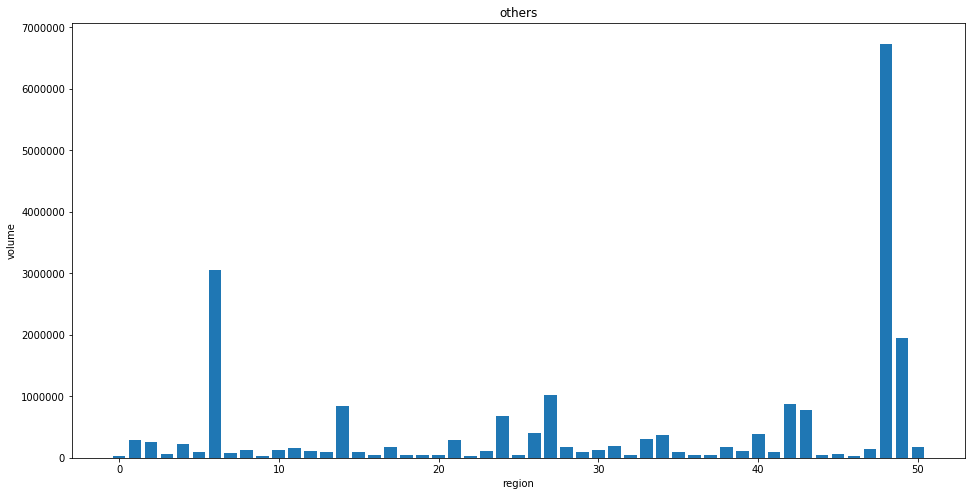

In [136]:
for i in ['4046','4225','4770','others']:
    plt.figure(figsize=(16,8))
    plt.xlabel('region')
    plt.ylabel('volume')
    plt.title(i)
    plt.bar('region',i,data=df)
    
    

In [137]:
df.drop(columns=['Unnamed: 0'],inplace=True)

In [138]:
df

,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,12,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.00,0,0,8696.87
1,12,1.35,674.28,44638.81,58.33,9408.07,97.49,0.00,0,0,9505.56
2,12,0.93,794.70,109149.67,130.50,8042.21,103.14,0.00,0,0,8145.35
3,06,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.00,0,0,5811.16
4,11,1.28,941.48,43838.39,75.78,5986.26,197.69,0.00,0,0,6183.95
5,11,1.26,1184.27,48067.99,43.61,6556.47,127.44,0.00,0,0,6683.91
6,11,0.99,1368.92,73672.72,93.26,8196.81,122.05,0.00,0,0,8318.86
7,08,0.98,703.75,101815.36,80.00,6266.85,562.37,0.00,0,0,6829.22
8,01,1.02,1022.15,87315.57,85.34,11104.53,283.83,0.00,0,0,11388.36
9,10,1.07,842.40,64757.44,113.00,8061.47,564.45,0.00,0,0,8625.92


# Correlation

In [139]:
dco=df.corr()
dco

,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
AveragePrice,1.000000,-0.190096,-0.092084,-0.100567,-0.097682,-0.177480,-0.048284,0.178683,-0.229408,-0.111597
4046,-0.190096,1.000000,0.951952,0.898570,0.922278,0.884229,0.474063,-0.040439,0.269481,0.930395
4225,-0.092084,0.951952,1.000000,0.927757,0.943988,0.900496,0.504718,-0.007254,0.215733,0.951779
4770,-0.100567,0.898570,0.927757,1.000000,0.923607,0.840523,0.646053,0.029222,0.138092,0.926405
Small Bags,-0.097682,0.922278,0.943988,0.923607,1.000000,0.879131,0.611300,0.106382,0.168650,0.997341
Large Bags,-0.177480,0.884229,0.900496,0.840523,0.879131,1.000000,0.447779,-0.018678,0.297452,0.911336
XLarge Bags,-0.048284,0.474063,0.504718,0.646053,0.611300,0.447779,1.000000,0.218342,-0.046144,0.601856
year,0.178683,-0.040439,-0.007254,0.029222,0.106382,-0.018678,0.218342,1.000000,-0.470472,0.090108
region,-0.229408,0.269481,0.215733,0.138092,0.168650,0.297452,-0.046144,-0.470472,1.000000,0.190001
others,-0.111597,0.930395,0.951779,0.926405,0.997341,0.911336,0.601856,0.090108,0.190001,1.000000


In [140]:
#Making an extension to be used further for the linear model
dco2=df.corr()


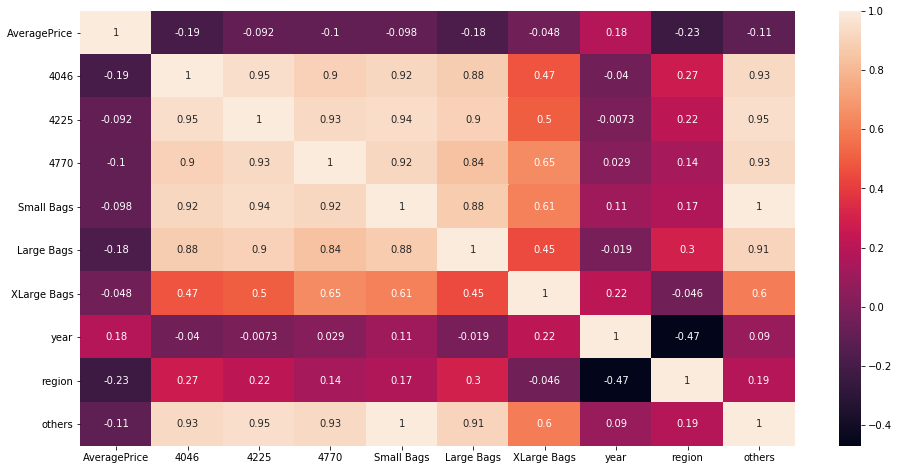

In [141]:
plt.figure(figsize=(16,8))
sns.heatmap(dco,annot=True)

# Region has high negative correlation with year



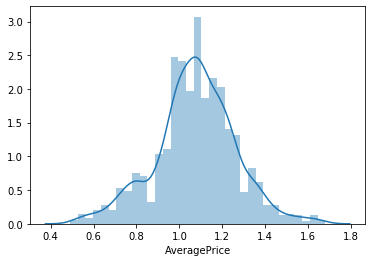

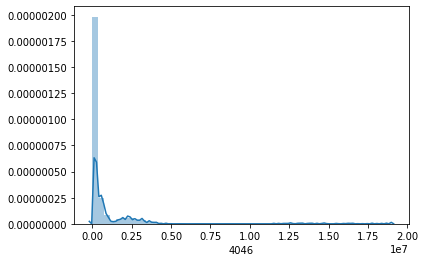

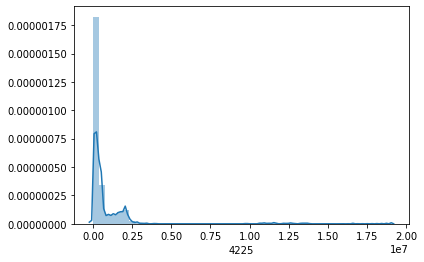

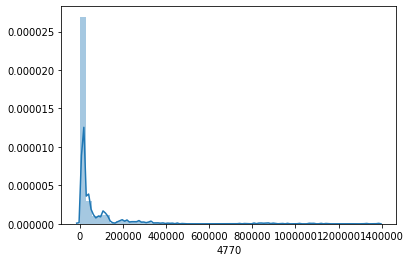

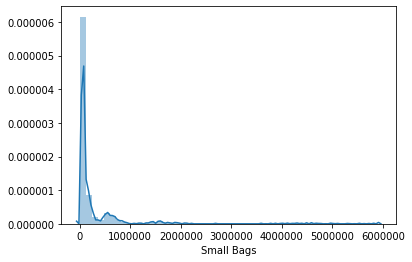

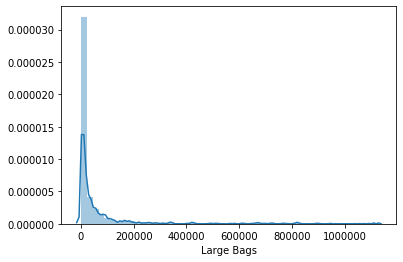

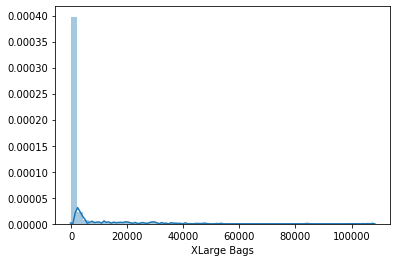

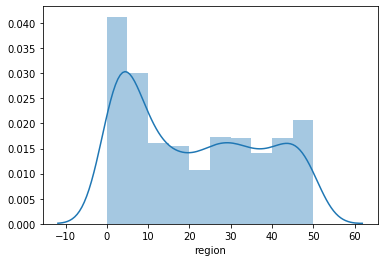

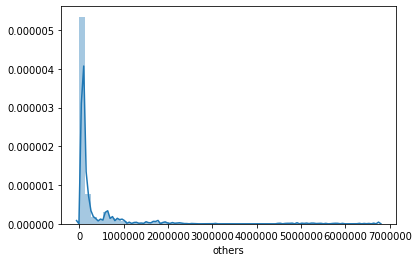

In [142]:
m=['AveragePrice','4046','4225','4770','Small Bags','Large Bags','XLarge Bags','region','others']
for i in m:
    sns.distplot(df[i])
    plt.show()
    

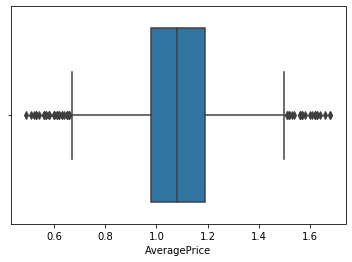

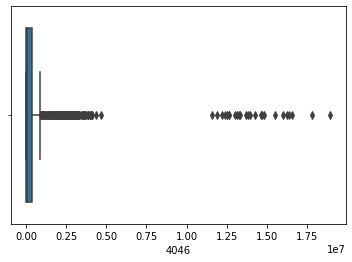

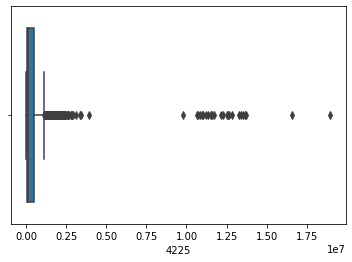

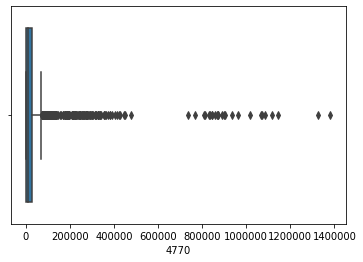

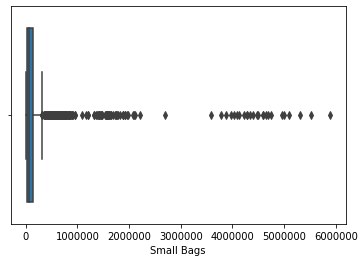

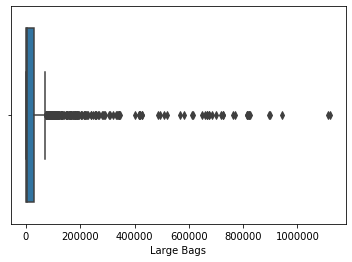

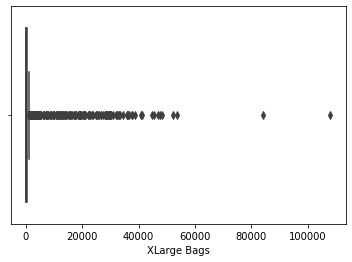

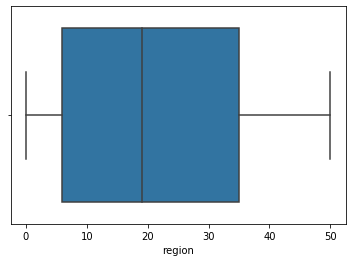

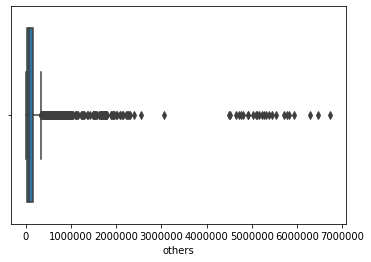

In [143]:
m=['AveragePrice','4046','4225','4770','Small Bags','Large Bags','XLarge Bags','region','others']
for i in m:
    sns.boxplot(df[i])
    plt.show()
    

# As can be seen , outliers and skewness present in various attributes need to be dealt with

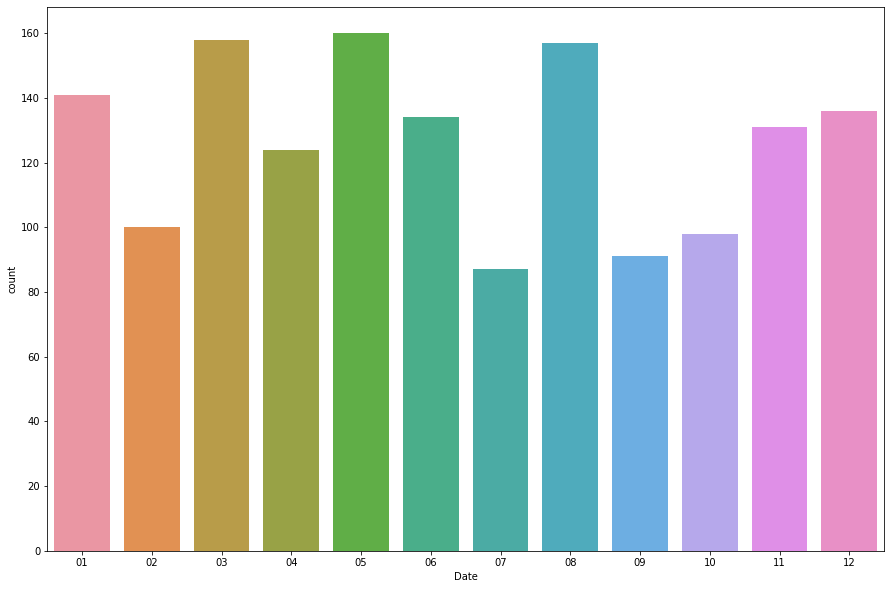

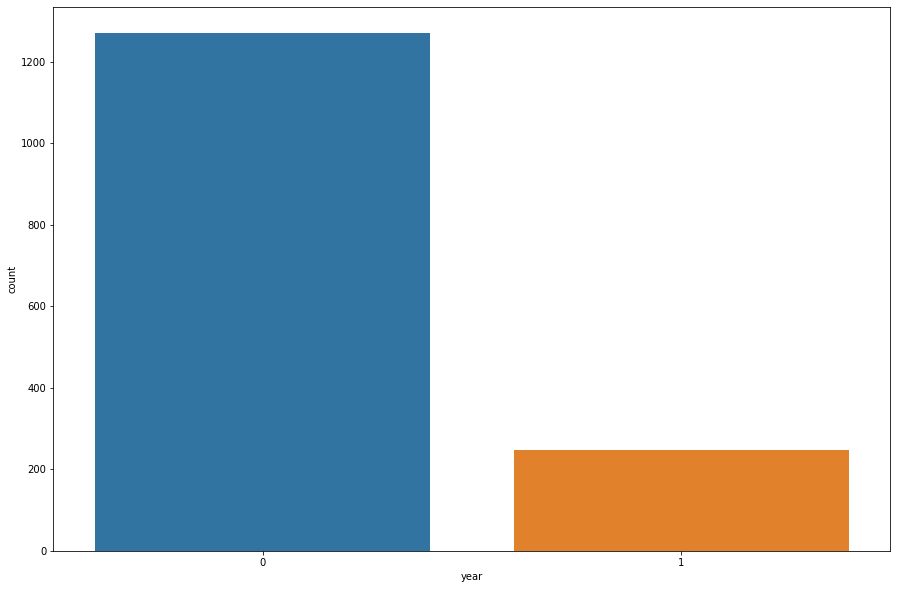

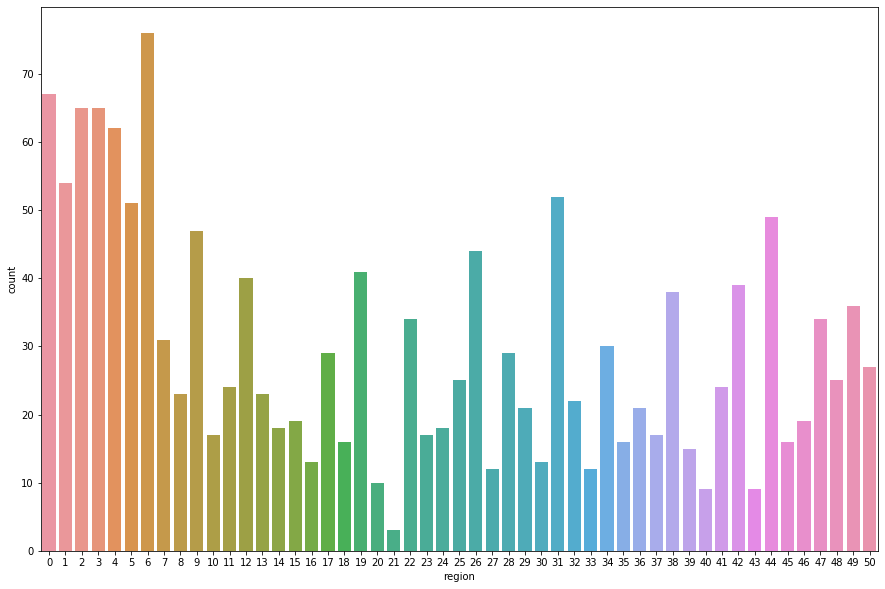

In [144]:
m=['Date','year','region']
for i in m:
    plt.figure(figsize=(15,10))
    sns.countplot(x=i,data=df)
    plt.show()

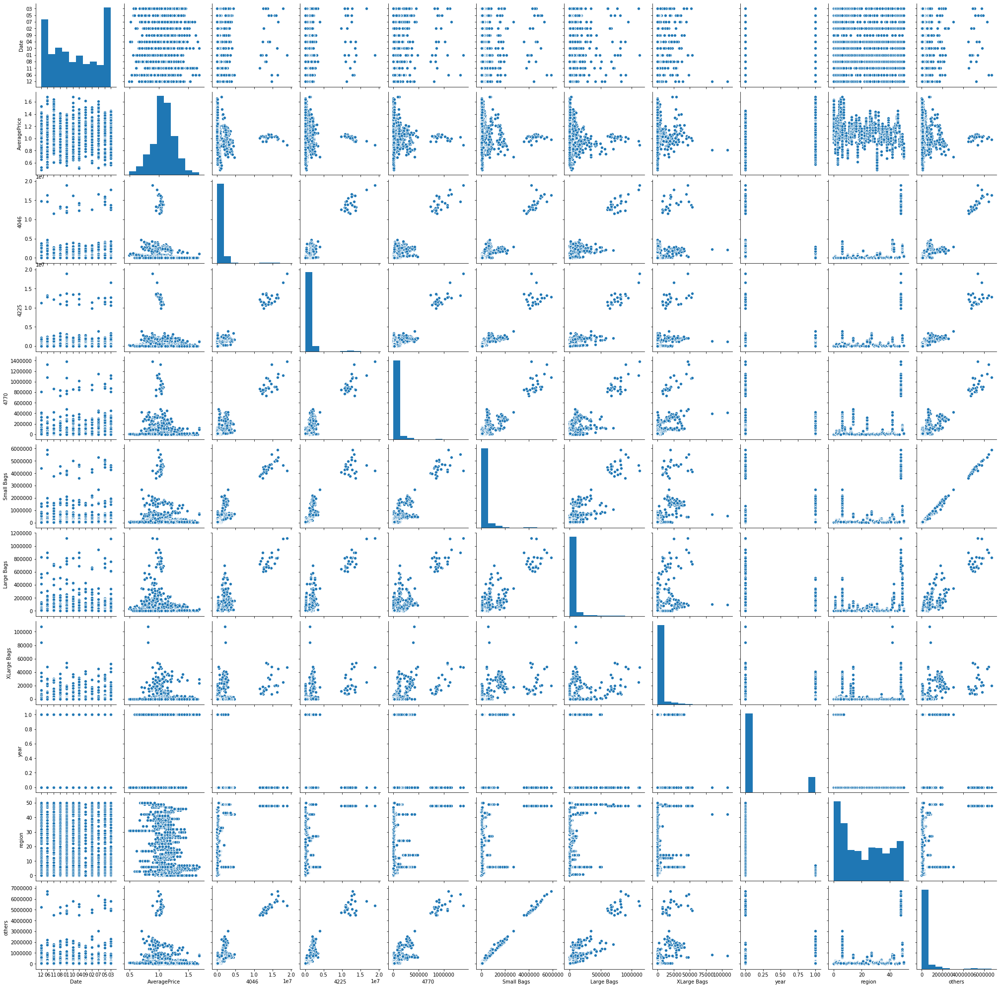

In [145]:
sns.pairplot(df)

# Removing the outliers

In [146]:
from scipy.stats import zscore

In [147]:
df

,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,12,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.00,0,0,8696.87
1,12,1.35,674.28,44638.81,58.33,9408.07,97.49,0.00,0,0,9505.56
2,12,0.93,794.70,109149.67,130.50,8042.21,103.14,0.00,0,0,8145.35
3,06,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.00,0,0,5811.16
4,11,1.28,941.48,43838.39,75.78,5986.26,197.69,0.00,0,0,6183.95
5,11,1.26,1184.27,48067.99,43.61,6556.47,127.44,0.00,0,0,6683.91
6,11,0.99,1368.92,73672.72,93.26,8196.81,122.05,0.00,0,0,8318.86
7,08,0.98,703.75,101815.36,80.00,6266.85,562.37,0.00,0,0,6829.22
8,01,1.02,1022.15,87315.57,85.34,11104.53,283.83,0.00,0,0,11388.36
9,10,1.07,842.40,64757.44,113.00,8061.47,564.45,0.00,0,0,8625.92


In [148]:
df.dtypes

Date             object
AveragePrice    float64
4046            float64
4225            float64
4770            float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
year              int64
region            int32
others          float64
dtype: object

In [149]:
df["Date"] = pd.to_numeric(df["Date"])

In [150]:
df.dtypes

Date              int64
AveragePrice    float64
4046            float64
4225            float64
4770            float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
year              int64
region            int32
others          float64
dtype: object

In [151]:
z_score=abs(zscore(df))
print(df.shape)
dffinal=df.loc[(z_score<3).all(axis=1)]
print(dffinal.shape)

(1517, 11)
(1436, 11)


In [152]:
dffinal

,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,12,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.00,0,0,8696.87
1,12,1.35,674.28,44638.81,58.33,9408.07,97.49,0.00,0,0,9505.56
2,12,0.93,794.70,109149.67,130.50,8042.21,103.14,0.00,0,0,8145.35
3,6,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.00,0,0,5811.16
4,11,1.28,941.48,43838.39,75.78,5986.26,197.69,0.00,0,0,6183.95
5,11,1.26,1184.27,48067.99,43.61,6556.47,127.44,0.00,0,0,6683.91
6,11,0.99,1368.92,73672.72,93.26,8196.81,122.05,0.00,0,0,8318.86
7,8,0.98,703.75,101815.36,80.00,6266.85,562.37,0.00,0,0,6829.22
8,1,1.02,1022.15,87315.57,85.34,11104.53,283.83,0.00,0,0,11388.36
9,10,1.07,842.40,64757.44,113.00,8061.47,564.45,0.00,0,0,8625.92


In [153]:
dffinal.skew()

Date            0.111898
AveragePrice   -0.184770
4046            3.120756
4225            2.367429
4770            3.331191
Small Bags      4.410267
Large Bags      3.518056
XLarge Bags     5.118965
year            2.004439
region          0.276276
others          4.165747
dtype: float64

In [154]:
for col in dffinal.columns:
    if dffinal.skew().loc[col]>0.55:
        dffinal[col]=np.log1p(dffinal[col])

In [155]:
dffinal.skew()

Date            0.111898
AveragePrice   -0.184770
4046           -0.270283
4225            0.011359
4770           -0.449713
Small Bags      0.420856
Large Bags     -0.979047
XLarge Bags     0.851740
year            2.004439
region          0.276276
others          0.378673
dtype: float64

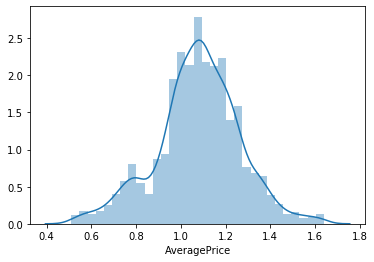

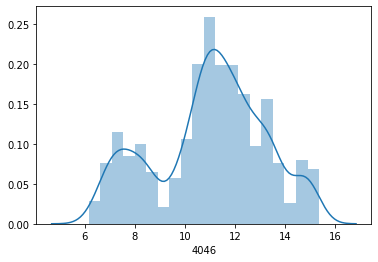

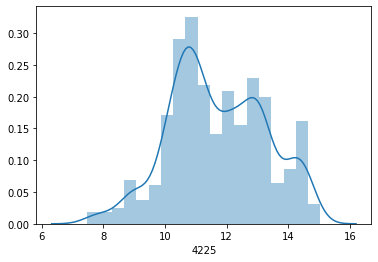

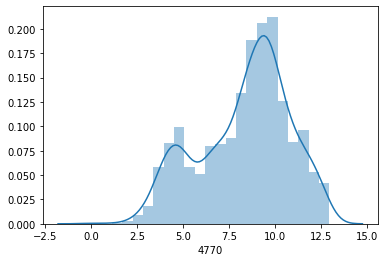

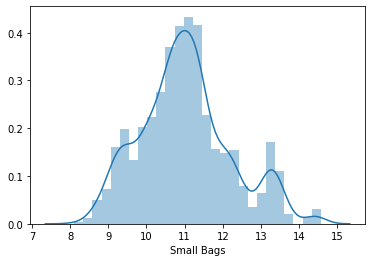

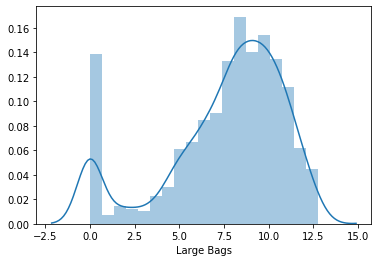

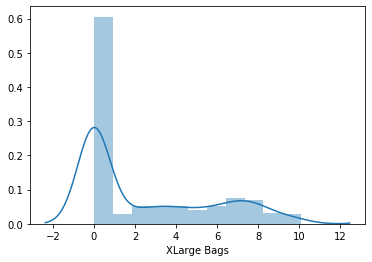

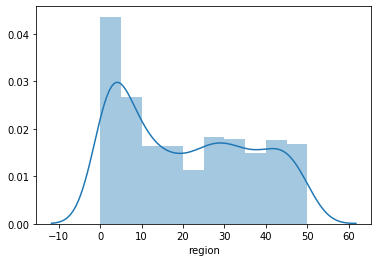

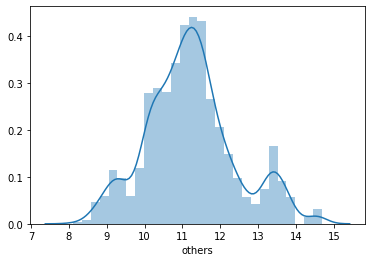

In [156]:
m=['AveragePrice','4046','4225','4770','Small Bags','Large Bags','XLarge Bags','region','others']
for i in m:
    sns.distplot(dffinal[i])
    plt.show()
    

# Thus , comparatively better distributed graphs are generated

In [157]:
dfnew=dffinal

x=dffinal.drop(columns=['region'])
y=dffinal['region']

In [158]:
x

,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,others
0,12,1.33,6.944801,10.905146,3.895080,9.060055,4.545951,0.000000,0.000000,9.070833
1,12,1.35,6.515127,10.706381,4.083115,9.149429,4.589955,0.000000,0.000000,9.159737
2,12,0.93,6.679222,11.600485,4.879007,8.992584,4.645736,0.000000,0.000000,9.005325
3,6,1.08,7.032624,11.184108,4.298373,8.644425,4.903495,0.000000,0.000000,8.667708
4,11,1.28,6.848515,10.688288,4.340944,8.697389,5.291746,0.000000,0.000000,8.729874
5,11,1.26,7.077726,10.780393,3.797958,8.788360,4.855462,0.000000,0.000000,8.807608
6,11,0.99,7.222508,11.207401,4.546057,9.011622,4.812591,0.000000,0.000000,9.026401
7,8,0.98,6.557843,11.530926,4.394449,8.743189,6.333937,0.000000,0.000000,8.829112
8,1,1.02,6.930641,11.377296,4.458293,9.315198,5.651893,0.000000,0.000000,9.340435
9,10,1.07,6.737441,11.078419,4.736198,8.994975,6.337622,0.000000,0.000000,9.062643


In [159]:
y

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
30       0
31       0
32       0
33       0
34       0
35       0
36       0
37       0
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       0
48       0
49       0
50       0
51       0
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       1
64       1
65       1
66       1
67       1
68       1
69       1
70       1
71       1
72       1
73       1
74       1
75       1
76       1
77       1
78       1
79       1
80       1
81       1
82       1
83       1
84       1
85       1
86       1
87       1
88       1
89       1
90       1

In [160]:
from sklearn.preprocessing import StandardScaler

In [161]:
scale=StandardScaler()
x=scale.fit_transform(x)
x

array([[ 1.6370045 ,  1.34498919, -1.84734499, ..., -0.77552838,
        -0.41387044, -1.8223586 ],
       [ 1.6370045 ,  1.451388  , -2.04282289, ..., -0.77552838,
        -0.41387044, -1.74680566],
       [ 1.6370045 , -0.78298709, -1.96816868, ..., -0.77552838,
        -0.41387044, -1.87802922],
       ...,
       [-1.2523004 ,  2.14298029, -0.11877204, ...,  1.33246252,
         2.41621506, -0.14755742],
       [ 0.77021303,  2.08978089, -0.04848702, ..., -0.77552838,
         2.41621506, -0.12716375],
       [ 0.77021303,  1.87698326, -0.15181664, ..., -0.77552838,
         2.41621506, -0.06104403]])

In [162]:
xd=pd.DataFrame(x)
xd

,0,1,2,3,4,5,6,7,8,9
0,1.637005,1.344989,-1.847345,-0.507917,-1.815979,-1.648547,-0.917419,-0.775528,-0.413870,-1.822359
1,1.637005,1.451388,-2.042823,-0.635183,-1.739119,-1.573622,-0.904196,-0.775528,-0.413870,-1.746806
2,1.637005,-0.782987,-1.968169,-0.062698,-1.413794,-1.705109,-0.887434,-0.775528,-0.413870,-1.878029
3,-0.096578,0.015004,-1.807390,-0.329300,-1.651131,-1.996977,-0.809976,-0.775528,-0.413870,-2.164946
4,1.348074,1.078992,-1.891150,-0.646768,-1.633730,-1.952576,-0.693305,-0.775528,-0.413870,-2.112115
5,1.348074,0.972593,-1.786871,-0.587795,-1.855678,-1.876313,-0.824410,-0.775528,-0.413870,-2.046055
6,1.348074,-0.463791,-1.721003,-0.314385,-1.549889,-1.689148,-0.837293,-0.775528,-0.413870,-1.860119
7,0.481283,-0.516990,-2.023390,-0.107236,-1.611859,-1.914181,-0.380121,-0.775528,-0.413870,-2.027780
8,-1.541231,-0.304192,-1.853787,-0.205604,-1.585763,-1.434655,-0.585079,-0.775528,-0.413870,-1.593244
9,1.059144,-0.038195,-1.941682,-0.396971,-1.472168,-1.703104,-0.379014,-0.775528,-0.413870,-1.829319


In [163]:
xd.skew()

0    0.111898
1   -0.184770
2   -0.270283
3    0.011359
4   -0.449713
5    0.420856
6   -0.979047
7    0.851740
8    2.004439
9    0.378673
dtype: float64

In [164]:
xd.isnull().sum()

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

In [165]:
xtrain,xtest,ytrain,ytest=train_test_split(xd,y,test_size=.22,random_state=42)

In [166]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.externals import joblib


In [167]:
print(xtrain.shape,xtest.shape)

(1120, 10) (316, 10)


In [168]:
print(ytrain.shape,ytest.shape)

(1120,) (316,)


In [169]:
def maxacc_score(regr,xd,y):
    max_ac_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(xd,y,test_size=.22,random_state=r_state)
        regr.fit(xtrain,ytrain)
        ypred=regr.predict(xtest)
        acc_scr=accuracy_score(ytest,ypred)
        print('acc score corresponding to ',r_state,'is',acc_scr)
        if acc_scr> max_ac_score:
            max_ac_score= acc_scr
            finalrstate=r_state
    print('max acc score corresponding to',finalrstate,'is',max_ac_score)
    return finalrstate

In [170]:
lr = LogisticRegression()
svc = SVC(probability=True)
dtc=DecisionTreeClassifier()
knc=KNeighborsClassifier()
rfc=RandomForestClassifier()
gbc=GradientBoostingClassifier()
adareg=AdaBoostClassifier()

parameters={'C': [100, 10, 1.0, 0.1, 0.01]}
clf=GridSearchCV(lr,parameters)
clf.fit(xd,y)
print('best LR parameters is :',clf.best_params_)
print('\n')
parameters={'C': [100, 10, 1.0, 0.1,200,500],'kernel':['poly', 'rbf']}
clf=GridSearchCV(svc,parameters)
clf.fit(xd,y)
print('best SVC parameters is :',clf.best_params_)
print('\n')
parameters={'criterion':['gini', 'entropy']}
clf=GridSearchCV(dtc,parameters)
clf.fit(xd,y)
print('best DTC parameters is :',clf.best_params_)
print('\n')
parameters={'n_neighbors':range(1,30)}
clf=GridSearchCV(knc,parameters)
clf.fit(xd,y)
print('best KNC parameters is :',clf.best_params_)
print('\n')
parameters={'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(rfc,parameters,cv=5)
clf.fit(xd,y)
print('best RFC parameters is :',clf.best_params_)
print('\n')


best LR parameters is : {'C': 100}


best SVC parameters is : {'C': 100, 'kernel': 'rbf'}


best DTC parameters is : {'criterion': 'entropy'}


best KNC parameters is : {'n_neighbors': 1}


best RFC parameters is : {'n_estimators': 150}




In [171]:
lr = LogisticRegression(C=100)
r_state=maxacc_score(lr,xd,y)
print('\n')
svc = SVC(C=100,kernel='rbf',probability=True)
r_state=maxacc_score(svc,xd,y)
print('\n')
dtc=DecisionTreeClassifier(criterion='entropy')
r_state=maxacc_score(dtc,xd,y)
print('\n')
knc=KNeighborsClassifier(n_neighbors= 1)
r_state=maxacc_score(knc,xd,y)
print('\n')
rfc=RandomForestClassifier(n_estimators=150)
r_state=maxacc_score(rfc,xd,y)
print('\n')


acc score corresponding to  42 is 0.9651898734177216
acc score corresponding to  43 is 0.9651898734177216
acc score corresponding to  44 is 0.9841772151898734
acc score corresponding to  45 is 0.9588607594936709
acc score corresponding to  46 is 0.9462025316455697
acc score corresponding to  47 is 0.9620253164556962
acc score corresponding to  48 is 0.9272151898734177
acc score corresponding to  49 is 0.9778481012658228
acc score corresponding to  50 is 0.9462025316455697
acc score corresponding to  51 is 0.9462025316455697
acc score corresponding to  52 is 0.9525316455696202
acc score corresponding to  53 is 0.9683544303797469
acc score corresponding to  54 is 0.9493670886075949
acc score corresponding to  55 is 0.9778481012658228
acc score corresponding to  56 is 0.9620253164556962
acc score corresponding to  57 is 0.9588607594936709
acc score corresponding to  58 is 0.9683544303797469
acc score corresponding to  59 is 0.9620253164556962
acc score corresponding to  60 is 0.9493670886

acc score corresponding to  80 is 0.8670886075949367
acc score corresponding to  81 is 0.8892405063291139
acc score corresponding to  82 is 0.8670886075949367
acc score corresponding to  83 is 0.9082278481012658
acc score corresponding to  84 is 0.8955696202531646
acc score corresponding to  85 is 0.9113924050632911
acc score corresponding to  86 is 0.9240506329113924
acc score corresponding to  87 is 0.9145569620253164
acc score corresponding to  88 is 0.8607594936708861
acc score corresponding to  89 is 0.870253164556962
acc score corresponding to  90 is 0.9145569620253164
acc score corresponding to  91 is 0.8924050632911392
acc score corresponding to  92 is 0.879746835443038
acc score corresponding to  93 is 0.8829113924050633
acc score corresponding to  94 is 0.8892405063291139
acc score corresponding to  95 is 0.8449367088607594
acc score corresponding to  96 is 0.8829113924050633
acc score corresponding to  97 is 0.8955696202531646
acc score corresponding to  98 is 0.882911392405

In [172]:
models=[]
models.append(('LogisticRegression',lr))
models.append(('SVC',svc))
models.append(('DTC',dtc))
models.append(('kNeighborsClassifier',knc))
models.append(('RFC',rfc))


In [173]:
Model=[]
score=[]
cvs=[]
for name,model in models:
    print('****,name,****')
    print('\n')
    Model.append(name)
    model.fit(xtrain,ytrain)
    print(model)
    pre=model.predict(xtest)
    print('\n')
    AS=accuracy_score(ytest,pre)
    print('accuracy score',AS)
    score.append(AS*100)
    print('\n')
    sc=cross_val_score(model,xd,y,cv=5,scoring='accuracy').mean()
    print('Cross val score',sc)
    cvs.append(sc*100)
    print('\n')
    print('classification report\n',classification_report(ytest,pre))
    print('\n')
    cm=confusion_matrix(ytest,pre)
    print(cm)
    print('\n')
    

****,name,****


LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


accuracy score 0.9651898734177216


Cross val score 0.9164634146341463


classification report
               precision    recall  f1-score   support

           0       1.00      0.93      0.97        15
           1       1.00      0.93      0.96        14
           2       0.92      1.00      0.96        12
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         9
           5       1.00      1.00      1.00        12
           6       1.00      1.00      1.00        11
           7       0.83      1.00      0.91        10
           8       1.00      1.00      1.00         6
           9      

classification report
               precision    recall  f1-score   support

           0       1.00      0.93      0.97        15
           1       1.00      0.93      0.96        14
           2       1.00      1.00      1.00        12
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         9
           5       1.00      1.00      1.00        12
           6       0.92      1.00      0.96        11
           7       0.91      1.00      0.95        10
           8       1.00      1.00      1.00         6
           9       0.79      1.00      0.88        11
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         4
          12       1.00      1.00      1.00        14
          13       1.00      0.80      0.89         5
          14       0.00      0.00      0.00         1
          15       1.00      1.00      1.00         5
          16       0.67      1.00      0.80         2
    

In [174]:
result=pd.DataFrame({'Model':Model,'Accuracy_score': score,'Cross val score': cvs})
result

,Model,Accuracy_score,Cross val score
0,LogisticRegression,96.518987,91.646341
1,SVC,96.518987,91.857094
2,DTC,89.556962,80.086140
3,kNeighborsClassifier,91.455696,85.172038
4,RFC,97.468354,92.206252


# RFC is selected with random state at 91

In [175]:
xtrain,xtest,ytrain,ytest=train_test_split(xd,y,test_size=.22,random_state=91)
rfc=RandomForestClassifier(n_estimators=200)
rfc.fit(xtrain,ytrain)
ypred=rfc.predict(xtest)

In [176]:
print('accuracy score of random forest classifier is',accuracy_score(ytest,ypred))
print(confusion_matrix(ytest,ypred))
print(classification_report(ytest,ypred))
print('\n')

accuracy score of random forest classifier is 0.9968354430379747
[[16  0  0 ...  0  0  0]
 [ 0  7  0 ...  0  0  0]
 [ 0  0 14 ...  0  0  0]
 ...
 [ 0  0  0 ...  6  0  0]
 [ 0  0  0 ...  0  6  0]
 [ 0  0  0 ...  0  0  7]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00        14
           3       1.00      0.92      0.96        13
           4       1.00      1.00      1.00        18
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00         9
           7       1.00      1.00      1.00        10
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         2
          12       1.00      1.00      1.00         5
          13       1.0

In [177]:
joblib.dump(rfc,'Model_avocado.csv')

['Model_avocado.csv']

In [178]:
model=joblib.load('Model_avocado.csv')

In [179]:
model.predict(xtest)

array([27,  9, 30, 43,  7, 41, 42, 12,  6,  5, 19,  1,  2,  5, 33, 11,  9,
       19,  6,  7,  3,  0, 26,  9, 49,  2, 28, 19,  5,  7,  5, 23,  4, 44,
        6, 34,  5,  0, 34,  7,  4, 28,  6,  2,  8, 47, 36,  7, 47, 50,  2,
       12, 18, 43, 41,  0,  0, 19, 44,  9, 45,  0, 43,  0,  9,  0, 22, 38,
       41,  1, 22,  4, 22, 12, 12,  9, 23,  9, 32, 15,  2, 31, 44, 26, 39,
        9,  9,  8,  0, 38, 13, 24,  7, 17, 19,  3,  6, 33, 19,  5,  4, 22,
       25, 28,  6, 38,  3, 50, 42, 49, 26, 39, 21, 39,  1, 41,  4,  4, 44,
        2, 44, 45, 31, 40, 14,  9,  0,  0,  5, 26, 31, 17, 29, 31,  7, 41,
        4,  3, 17, 17, 22,  4,  8,  2, 36, 34, 42,  9, 37, 26, 37,  4,  2,
       36, 50, 45, 42,  8, 22, 28, 26,  3, 36,  6, 38, 41, 31,  4, 50, 11,
       39,  9, 45,  2, 44,  5, 19, 45,  7, 26, 26,  0,  3, 50, 25, 41, 26,
       44, 37, 42, 44, 23,  9, 39, 38, 35, 45, 29, 22, 37, 46,  0, 17, 36,
       41,  4, 28, 32,  2,  4, 17, 30,  0,  9, 38,  2,  3, 31, 32, 27, 38,
        1, 26, 19,  4,  7

# ****************************"Linear Regression case"***********

In [180]:
df2

,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,12,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.00,0,0,8696.87
1,12,1.35,674.28,44638.81,58.33,9408.07,97.49,0.00,0,0,9505.56
2,12,0.93,794.70,109149.67,130.50,8042.21,103.14,0.00,0,0,8145.35
3,6,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.00,0,0,5811.16
4,11,1.28,941.48,43838.39,75.78,5986.26,197.69,0.00,0,0,6183.95
5,11,1.26,1184.27,48067.99,43.61,6556.47,127.44,0.00,0,0,6683.91
6,11,0.99,1368.92,73672.72,93.26,8196.81,122.05,0.00,0,0,8318.86
7,8,0.98,703.75,101815.36,80.00,6266.85,562.37,0.00,0,0,6829.22
8,1,1.02,1022.15,87315.57,85.34,11104.53,283.83,0.00,0,0,11388.36
9,10,1.07,842.40,64757.44,113.00,8061.47,564.45,0.00,0,0,8625.92


In [181]:
dco2=df2.corr()
dco2

,Date,AveragePrice,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
Date,1.000000,0.060642,-0.053007,-0.058429,-0.055079,-0.048978,-0.039242,0.021452,-0.013144,0.000977,-0.047747
AveragePrice,0.060642,1.000000,-0.190096,-0.092084,-0.100567,-0.097682,-0.177480,-0.048284,0.178683,-0.229408,-0.111597
4046,-0.053007,-0.190096,1.000000,0.951952,0.898570,0.922278,0.884229,0.474063,-0.040439,0.269481,0.930395
4225,-0.058429,-0.092084,0.951952,1.000000,0.927757,0.943988,0.900496,0.504718,-0.007254,0.215733,0.951779
4770,-0.055079,-0.100567,0.898570,0.927757,1.000000,0.923607,0.840523,0.646053,0.029222,0.138092,0.926405
Small Bags,-0.048978,-0.097682,0.922278,0.943988,0.923607,1.000000,0.879131,0.611300,0.106382,0.168650,0.997341
Large Bags,-0.039242,-0.177480,0.884229,0.900496,0.840523,0.879131,1.000000,0.447779,-0.018678,0.297452,0.911336
XLarge Bags,0.021452,-0.048284,0.474063,0.504718,0.646053,0.611300,0.447779,1.000000,0.218342,-0.046144,0.601856
year,-0.013144,0.178683,-0.040439,-0.007254,0.029222,0.106382,-0.018678,0.218342,1.000000,-0.470472,0.090108
region,0.000977,-0.229408,0.269481,0.215733,0.138092,0.168650,0.297452,-0.046144,-0.470472,1.000000,0.190001


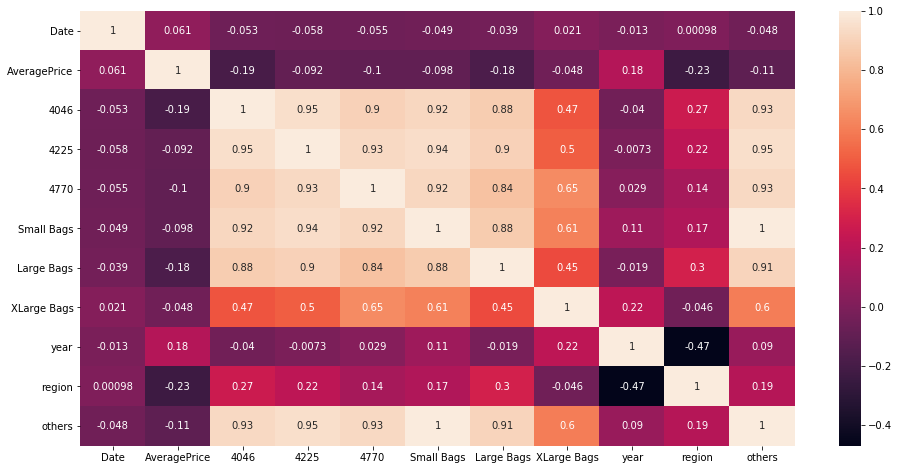

In [182]:
plt.figure(figsize=(16,8))
sns.heatmap(dco2,annot=True)

In [183]:
df2.dtypes

Date              int64
AveragePrice    float64
4046            float64
4225            float64
4770            float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
year              int64
region            int32
others          float64
dtype: object

In [184]:
z_score=abs(zscore(df2))
print(df2.shape)
dfnew=df.loc[(z_score<3).all(axis=1)]
print(dfnew.shape)

(1517, 11)
(1436, 11)


In [185]:
dfnew.skew()

Date            0.111898
AveragePrice   -0.184770
4046            3.120756
4225            2.367429
4770            3.331191
Small Bags      4.410267
Large Bags      3.518056
XLarge Bags     5.118965
year            2.004439
region          0.276276
others          4.165747
dtype: float64

In [186]:
for col in dfnew.columns:
    if dfnew.skew().loc[col]>0.55:
        dfnew[col]=np.log1p(dfnew[col])

In [187]:
dfnew.skew()

Date            0.111898
AveragePrice   -0.184770
4046           -0.270283
4225            0.011359
4770           -0.449713
Small Bags      0.420856
Large Bags     -0.979047
XLarge Bags     0.851740
year            2.004439
region          0.276276
others          0.378673
dtype: float64

In [188]:
x=dfnew.drop(columns=['AveragePrice'])
y=dfnew['AveragePrice']

In [189]:
x

,Date,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,year,region,others
0,12,6.944801,10.905146,3.895080,9.060055,4.545951,0.000000,0.000000,0,9.070833
1,12,6.515127,10.706381,4.083115,9.149429,4.589955,0.000000,0.000000,0,9.159737
2,12,6.679222,11.600485,4.879007,8.992584,4.645736,0.000000,0.000000,0,9.005325
3,6,7.032624,11.184108,4.298373,8.644425,4.903495,0.000000,0.000000,0,8.667708
4,11,6.848515,10.688288,4.340944,8.697389,5.291746,0.000000,0.000000,0,8.729874
5,11,7.077726,10.780393,3.797958,8.788360,4.855462,0.000000,0.000000,0,8.807608
6,11,7.222508,11.207401,4.546057,9.011622,4.812591,0.000000,0.000000,0,9.026401
7,8,6.557843,11.530926,4.394449,8.743189,6.333937,0.000000,0.000000,0,8.829112
8,1,6.930641,11.377296,4.458293,9.315198,5.651893,0.000000,0.000000,0,9.340435
9,10,6.737441,11.078419,4.736198,8.994975,6.337622,0.000000,0.000000,0,9.062643


In [190]:
y

0       1.33
1       1.35
2       0.93
3       1.08
4       1.28
5       1.26
6       0.99
7       0.98
8       1.02
9       1.07
10      1.12
11      1.28
12      1.31
13      0.99
14      1.33
15      1.28
16      1.11
17      1.07
18      1.34
19      1.33
20      1.12
21      1.45
22      1.11
23      1.26
24      1.05
25      1.35
26      1.37
27      1.27
28      1.32
29      1.07
30      1.23
31      1.19
32      1.43
33      1.26
34      1.20
35      1.22
36      1.19
37      1.13
38      1.16
39      1.02
40      1.12
41      1.11
42      1.07
43      0.99
44      1.07
45      1.06
46      0.99
47      0.99
48      1.06
49      1.17
50      1.24
51      1.22
52      0.99
53      1.08
54      0.96
55      1.07
56      0.99
57      1.00
58      1.13
59      1.12
60      0.99
61      1.09
62      1.09
63      0.95
64      0.96
65      1.07
66      0.93
67      1.07
68      0.97
69      1.15
70      1.12
71      1.09
72      1.01
73      1.15
74      1.08
75      0.97
76      1.14

In [191]:
from sklearn.preprocessing import StandardScaler

In [192]:
scale=StandardScaler()
x=scale.fit_transform(x)
x

array([[ 1.6370045 , -1.84734499, -0.50791653, ..., -0.41387044,
        -1.32281743, -1.8223586 ],
       [ 1.6370045 , -2.04282289, -0.63518322, ..., -0.41387044,
        -1.32281743, -1.74680566],
       [ 1.6370045 , -1.96816868, -0.06269814, ..., -0.41387044,
        -1.32281743, -1.87802922],
       ...,
       [-1.2523004 , -0.11877204, -0.5265446 , ...,  2.41621506,
        -0.87930451, -0.14755742],
       [ 0.77021303, -0.04848702, -0.51812425, ...,  2.41621506,
        -0.87930451, -0.12716375],
       [ 0.77021303, -0.15181664, -0.51099782, ...,  2.41621506,
        -0.87930451, -0.06104403]])

In [193]:
xd=pd.DataFrame(x)
xd

,0,1,2,3,4,5,6,7,8,9
0,1.637005,-1.847345,-0.507917,-1.815979,-1.648547,-0.917419,-0.775528,-0.413870,-1.322817,-1.822359
1,1.637005,-2.042823,-0.635183,-1.739119,-1.573622,-0.904196,-0.775528,-0.413870,-1.322817,-1.746806
2,1.637005,-1.968169,-0.062698,-1.413794,-1.705109,-0.887434,-0.775528,-0.413870,-1.322817,-1.878029
3,-0.096578,-1.807390,-0.329300,-1.651131,-1.996977,-0.809976,-0.775528,-0.413870,-1.322817,-2.164946
4,1.348074,-1.891150,-0.646768,-1.633730,-1.952576,-0.693305,-0.775528,-0.413870,-1.322817,-2.112115
5,1.348074,-1.786871,-0.587795,-1.855678,-1.876313,-0.824410,-0.775528,-0.413870,-1.322817,-2.046055
6,1.348074,-1.721003,-0.314385,-1.549889,-1.689148,-0.837293,-0.775528,-0.413870,-1.322817,-1.860119
7,0.481283,-2.023390,-0.107236,-1.611859,-1.914181,-0.380121,-0.775528,-0.413870,-1.322817,-2.027780
8,-1.541231,-1.853787,-0.205604,-1.585763,-1.434655,-0.585079,-0.775528,-0.413870,-1.322817,-1.593244
9,1.059144,-1.941682,-0.396971,-1.472168,-1.703104,-0.379014,-0.775528,-0.413870,-1.322817,-1.829319


In [194]:
xd.skew()

0    0.111898
1   -0.270283
2    0.011359
3   -0.449713
4    0.420856
5   -0.979047
6    0.851740
7    2.004439
8    0.276276
9    0.378673
dtype: float64

In [195]:
xd.isnull().sum()

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

In [196]:
xtrain,xtest,ytrain,ytest=train_test_split(xd,y,test_size=.20,random_state=42)

In [197]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.externals import joblib

In [198]:
def maxr2_score(regr,xd,y):
    max_r_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(xd,y,test_size=.20,random_state=r_state)
        regr.fit(xtrain,ytrain)
        ypred=regr.predict(xtest)
        r2_scr=r2_score(ytest,ypred)
        print('r2 score corresponding to ',r_state,'is',r2_scr)
        if r2_scr>max_r_score:
            max_r_score= r2_scr
            finalrstate=r_state
    print('max r2 score corresponding to',finalrstate,'is',max_r_score)
    return finalrstate

In [199]:
lreg=LinearRegression()
r_state=maxr2_score(lreg,xd,y)

r2 score corresponding to  42 is 0.39327052700109066
r2 score corresponding to  43 is 0.3017626129794948
r2 score corresponding to  44 is 0.20681746146912405
r2 score corresponding to  45 is 0.35262187062894956
r2 score corresponding to  46 is 0.3497086254423115
r2 score corresponding to  47 is 0.34584542547433395
r2 score corresponding to  48 is 0.3111403911998367
r2 score corresponding to  49 is 0.25257262651484347
r2 score corresponding to  50 is 0.3741335322195106
r2 score corresponding to  51 is 0.32515949957168755
r2 score corresponding to  52 is 0.3417124303874147
r2 score corresponding to  53 is 0.31892753375645466
r2 score corresponding to  54 is 0.35591648880598115
r2 score corresponding to  55 is 0.2686229642614406
r2 score corresponding to  56 is 0.2357134216208966
r2 score corresponding to  57 is 0.4385124613854512
r2 score corresponding to  58 is 0.23279066015740457
r2 score corresponding to  59 is 0.35770483160898725
r2 score corresponding to  60 is 0.2548004873381442
r2

In [200]:
print('mean r2 score for LR',cross_val_score(lreg,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for LR is',cross_val_score(lreg,xd,y,cv=5,scoring='r2').std())

mean r2 score for LR -0.059035084922762396
Std dev. in r2 score for LR is 0.2818984351529537


In [201]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neighbors={'n_neighbors':range(1,30)}
knr=KNeighborsRegressor()
gknr=GridSearchCV(knr,neighbors,cv=5)
gknr.fit(xd,y)
gknr.best_params_

{'n_neighbors': 29}

In [202]:
knr=KNeighborsRegressor(n_neighbors=29)
r_state=maxr2_score(knr,xd,y)

r2 score corresponding to  42 is 0.5633263217438507
r2 score corresponding to  43 is 0.5583393246896855
r2 score corresponding to  44 is 0.4275934044398946
r2 score corresponding to  45 is 0.536440856147376
r2 score corresponding to  46 is 0.5468078484911947
r2 score corresponding to  47 is 0.5154283516541807
r2 score corresponding to  48 is 0.49599137111890157
r2 score corresponding to  49 is 0.45181576832888115
r2 score corresponding to  50 is 0.5898318905266062
r2 score corresponding to  51 is 0.5310275947013714
r2 score corresponding to  52 is 0.5171025401447622
r2 score corresponding to  53 is 0.5433284716984217
r2 score corresponding to  54 is 0.588849042653167
r2 score corresponding to  55 is 0.5387455513454737
r2 score corresponding to  56 is 0.4860382690461673
r2 score corresponding to  57 is 0.5585802451054491
r2 score corresponding to  58 is 0.5221639805593024
r2 score corresponding to  59 is 0.5768433031561842
r2 score corresponding to  60 is 0.5268297577953371
r2 score cor

In [203]:
print('mean r2 score for KNN',cross_val_score(knr,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for KNR is',cross_val_score(knr,xd,y,cv=5,scoring='r2').std())

mean r2 score for KNN -0.14213106279379678
Std dev. in r2 score for KNR is 0.4881212566759149


In [204]:
alphavalue={'alpha':[1,0.1,0.001,0.0001]}
list=[Lasso(),Ridge(),ElasticNet()]
for i in list:
    grid=GridSearchCV(estimator=i,param_grid=alphavalue)
    grid.fit(xd,y)
    print(grid.best_score_)
    print(grid.best_estimator_.alpha)
    print(grid.best_params_)
    print('\n')

-0.03589623339464616
0.1
{'alpha': 0.1}


-0.05903535992179676
0.0001
{'alpha': 0.0001}


0.15871696776469707
0.1
{'alpha': 0.1}




In [205]:
ela=ElasticNet(alpha=0.1)
r_state=maxr2_score(ela,xd,y)

r2 score corresponding to  42 is 0.2261388374357528
r2 score corresponding to  43 is 0.2114732692497998
r2 score corresponding to  44 is 0.1375239361477042
r2 score corresponding to  45 is 0.22238651812386812
r2 score corresponding to  46 is 0.2313752324820587
r2 score corresponding to  47 is 0.20728075141510738
r2 score corresponding to  48 is 0.21938148261711632
r2 score corresponding to  49 is 0.20121139503412921
r2 score corresponding to  50 is 0.22894596791615696
r2 score corresponding to  51 is 0.20617018816405608
r2 score corresponding to  52 is 0.2069444564613464
r2 score corresponding to  53 is 0.20054423204073657
r2 score corresponding to  54 is 0.22044586654978127
r2 score corresponding to  55 is 0.18520246667738183
r2 score corresponding to  56 is 0.18717762910168845
r2 score corresponding to  57 is 0.23681354784786668
r2 score corresponding to  58 is 0.18699923444894018
r2 score corresponding to  59 is 0.21644627811376405
r2 score corresponding to  60 is 0.2046734041409436

In [206]:
ela=ElasticNet(alpha=0.1)
print('mean r2 score for LA',cross_val_score(ela,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for LA is',cross_val_score(ela,xd,y,cv=5,scoring='r2').std())

mean r2 score for LA 0.15871696776469707
Std dev. in r2 score for LA is 0.08944224512328912


In [207]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(xd,y)
clf.best_params_

{'learning_rate': 0.01, 'n_estimators': 150}

In [208]:
gbr=GradientBoostingRegressor(learning_rate=0.01,n_estimators=150)
print('mean r2 score for GBR is',cross_val_score(gbr,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for GBR is',cross_val_score(gbr,xd,y,cv=5,scoring='r2').std())

mean r2 score for GBR is 0.24622616086237178
Std dev. in r2 score for GBR is 0.1496943878896776


In [209]:
gbr=GradientBoostingRegressor(learning_rate=0.01,n_estimators=150)
r_state=maxr2_score(gbr,xd,y)

r2 score corresponding to  42 is 0.5625119845936426
r2 score corresponding to  43 is 0.5574397235686941
r2 score corresponding to  44 is 0.4073214441186582
r2 score corresponding to  45 is 0.5329012567429596
r2 score corresponding to  46 is 0.5040753682210964
r2 score corresponding to  47 is 0.5423431942732302
r2 score corresponding to  48 is 0.5087536639214573
r2 score corresponding to  49 is 0.5362937579707044
r2 score corresponding to  50 is 0.5410806676606443
r2 score corresponding to  51 is 0.5260591933453923
r2 score corresponding to  52 is 0.5825554983529968
r2 score corresponding to  53 is 0.537914120725381
r2 score corresponding to  54 is 0.5937911574642883
r2 score corresponding to  55 is 0.5459806840424422
r2 score corresponding to  56 is 0.5109737107561174
r2 score corresponding to  57 is 0.5669761179619477
r2 score corresponding to  58 is 0.5054518064345757
r2 score corresponding to  59 is 0.5638702844899499
r2 score corresponding to  60 is 0.5425941960595795
r2 score corr

In [210]:
rfr=RandomForestRegressor()
parameters={'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(rfr,parameters,cv=5)
clf.fit(xd,y)
clf.best_params_

{'n_estimators': 300}

In [211]:
rfr=RandomForestRegressor(n_estimators=300)
print('mean r2 score for SVR is',cross_val_score(rfr,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for SVR is',cross_val_score(rfr,xd,y,cv=5,scoring='r2').std())

mean r2 score for SVR is 0.16193654322374695
Std dev. in r2 score for SVR is 0.33060449103318085


In [212]:
adareg=AdaBoostRegressor()
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300],'base_estimator':[lreg,ela]}
clf=GridSearchCV(adareg,parameters,cv=5)
clf.fit(xd,y)
clf.best_params_

{'base_estimator': ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0.5,
            max_iter=1000, normalize=False, positive=False, precompute=False,
            random_state=None, selection='cyclic', tol=0.0001, warm_start=False),
 'learning_rate': 0.1,
 'n_estimators': 50}

In [213]:
adareg=AdaBoostRegressor(learning_rate=0.1,n_estimators=50,base_estimator=ela)
print('mean r2 score for ABR is',cross_val_score(adareg,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for ABR is',cross_val_score(adareg,xd,y,cv=5,scoring='r2').std())

mean r2 score for ABR is 0.18690240989146883
Std dev. in r2 score for ABR is 0.15546374483465006


In [214]:
svr=SVR()
parameters={'kernel':['linear','poly','rbf'],'C':[1,10]}
clf=GridSearchCV(svr,parameters,cv=5)
clf.fit(xd,y)
clf.best_params_


{'C': 1, 'kernel': 'rbf'}

In [215]:
svr=SVR(kernel='rbf',C=1)
print('mean r2 score for SVR is',cross_val_score(svr,xd,y,cv=5,scoring='r2').mean())
print('Std dev. in r2 score for SVR is',cross_val_score(svr,xd,y,cv=5,scoring='r2').std())

mean r2 score for SVR is 0.14207240598117293
Std dev. in r2 score for SVR is 0.28764258354323674


# Of all the tested models,Gradientboosting regressor is the best one
With random state at 74

In [216]:
xtrain,xtest,ytrain,ytest=train_test_split(xd,y,test_size=.20,random_state=74)
gbr=GradientBoostingRegressor(learning_rate=0.01,n_estimators=150)
gbr.fit(xtrain,ytrain)
ypred=gbr.predict(xtest)

In [217]:
print('RMSE is',np.sqrt(mean_squared_error(ytest,ypred)))
print('r2_score is',r2_score(ytest,ypred))

RMSE is 0.11515467577966007
r2_score is 0.6083705243333579


In [218]:
joblib.dump(gbr,'Model_avocadolinear.csv')

['Model_avocadolinear.csv']

In [219]:
model=joblib.load('Model_avocadolinear.csv')

In [220]:
model.predict(xtest)

array([1.07945802, 0.79991924, 0.86234801, 1.09138371, 1.12653655,
       1.11059059, 1.16509022, 1.05382519, 0.98472775, 1.1099035 ,
       0.98512355, 0.84484374, 1.16509022, 1.11895001, 1.08071236,
       0.98333716, 1.04733987, 1.05624753, 1.134692  , 1.24523559,
       1.06682057, 1.01353951, 0.94273213, 1.06793855, 1.1761941 ,
       1.0051808 , 1.15405541, 1.09031182, 1.01948095, 1.14986264,
       1.0624154 , 1.18362563, 1.11059059, 1.02478304, 1.0051808 ,
       1.12340028, 1.04719823, 0.7724828 , 1.10933624, 1.10404294,
       1.08569328, 1.04719823, 1.13250949, 1.02478304, 1.22498081,
       1.04719823, 1.1761941 , 1.1257232 , 1.14620881, 1.11059059,
       1.0051808 , 1.13758639, 1.06365556, 1.02023507, 1.13758639,
       1.16757168, 1.1054447 , 1.0417707 , 1.06365556, 1.0051808 ,
       0.7724828 , 1.14986264, 1.15923018, 0.98344943, 1.12877078,
       1.20931761, 1.08386543, 1.07021344, 1.06365556, 1.1257232 ,
       0.82074389, 0.97021348, 1.05341589, 1.13831341, 1.14986